<a href="https://colab.research.google.com/github/Vaisakh-Babu/Exploratory_Data_Analysis-Fordgobike-BayWheels-_Dataset/blob/master/FordGoBike_Exploratory_Data_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Ford GoBike Data exploration
##By Vaisakh Babu

###Introduction
Ford GoBike (Bay Wheels) is a regional public bicycle sharing system in the San Francisco Bay Area, California operated by Motivate in a partnership with the Metropolitan Transportation Commission and the Bay Area Air Quality Management District.[[01]](https://en.wikipedia.org/wiki/Bay_Wheels)
Our major aim of this report is to understand our target customers. Also we will see the stations those need more importance and trip durations.

In [ ]:
# importing packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
df = pd.read_csv('https://s3.amazonaws.com/fordgobike-data/201808-fordgobike-tripdata.csv.zip')

The size of the data is,

In [ ]:
df.shape

(192162, 16)

The dataset has the columns : 

In [ ]:
df.columns

Index(['duration_sec', 'start_time', 'end_time', 'start_station_id',
       'start_station_name', 'start_station_latitude',
       'start_station_longitude', 'end_station_id', 'end_station_name',
       'end_station_latitude', 'end_station_longitude', 'bike_id', 'user_type',
       'member_birth_year', 'member_gender', 'bike_share_for_all_trip'],
      dtype='object')

We know the data collection had taken place in the year 2018. There for we can derive the age of the user from the column 'member_birth_year'

In [ ]:
df['member_age'] = 2018 - df['member_birth_year']

Now we have the dataset which contains 17 columns and 192162 rows

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 192162 entries, 0 to 192161
Data columns (total 17 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   duration_sec             192162 non-null  int64  
 1   start_time               192162 non-null  object 
 2   end_time                 192162 non-null  object 
 3   start_station_id         189250 non-null  float64
 4   start_station_name       189250 non-null  object 
 5   start_station_latitude   192162 non-null  float64
 6   start_station_longitude  192162 non-null  float64
 7   end_station_id           189250 non-null  float64
 8   end_station_name         189250 non-null  object 
 9   end_station_latitude     192162 non-null  float64
 10  end_station_longitude    192162 non-null  float64
 11  bike_id                  192162 non-null  int64  
 12  user_type                192162 non-null  object 
 13  member_birth_year        181247 non-null  float64
 14  memb

Some columns have null values in our data. To see the coverage, 

In [ ]:
pd.DataFrame(((df.count()-df.isnull().sum())/df.count())*100 , columns=['Coverage'])

,Coverage
duration_sec,100.000000
start_time,100.000000
end_time,100.000000
start_station_id,98.461295
start_station_name,98.461295
start_station_latitude,100.000000
start_station_longitude,100.000000
end_station_id,98.461295
end_station_name,98.461295
end_station_latitude,100.000000


>We can see that 1.54 % of sart and end station information, 6.02 % of member age details and 6 % of member gender details are not available for the 192162 records available in the dataset. 
This can be due to two causes,
1. the user maynot have shared their age and gender information or
2. data collection time error.


In [ ]:
fig1 = pd.DataFrame(((df.count()-df.isnull().sum())/df.count())*100 , columns=['Coverage']).reset_index()
fig = px.bar(fig1, y='Coverage', x= 'index', title='Coverage of Variables', width=800, height=900)
fig.show()

In [ ]:
fig1

,index,Coverage
0,duration_sec,100.000000
1,start_time,100.000000
2,end_time,100.000000
3,start_station_id,98.461295
4,start_station_name,98.461295
5,start_station_latitude,100.000000
6,start_station_longitude,100.000000
7,end_station_id,98.461295
8,end_station_name,98.461295
9,end_station_latitude,100.000000


We have a coverage more than 93 % for all the columns, so we are good to go for the analysis.

The first 5 rows of our dataset are :

In [ ]:
df.head()

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,bike_share_for_all_trip,member_age
0,69465,2018-08-31 19:18:08.6130,2018-09-01 14:35:54.0640,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,813,Customer,NaN,NaN,No,NaN
1,60644,2018-08-31 21:40:01.7490,2018-09-01 14:30:46.4470,50.0,2nd St at Townsend St,37.780526,-122.390288,50.0,2nd St at Townsend St,37.780526,-122.390288,1964,Subscriber,1990.0,Male,No,28.0
2,57922,2018-08-31 20:04:28.1630,2018-09-01 12:09:50.8240,17.0,Embarcadero BART Station (Beale St at Market St),37.792251,-122.397086,30.0,San Francisco Caltrain (Townsend St at 4th St),37.776598,-122.395282,535,Customer,1997.0,Male,No,21.0
3,82573,2018-08-31 13:07:14.9020,2018-09-01 12:03:28.2600,19.0,Post St at Kearny St,37.788975,-122.403452,34.0,Father Alfred E Boeddeker Park,37.783988,-122.412408,3080,Customer,2000.0,Female,No,18.0
4,57677,2018-08-31 19:48:45.1980,2018-09-01 11:50:03.1560,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,132,Customer,NaN,NaN,No,NaN


>Our analysis will be mainely based on
1. member_age
2. member_gender
3. start/end_station
4. duration
5. user_type


##Univariate Exploration
First of all, we will look into the statistical summary.

In [ ]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
duration_sec,192162,NaN,NaN,NaN,871.053,2413.88,61,355,564,887,85967
start_time,192162,192141,2018-08-27 17:25:34.1100,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
end_time,192162,192148,2018-08-12 14:28:44.9470,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
start_station_id,189250,NaN,NaN,NaN,123.508,102.128,3,36,91,195,367
start_station_name,189250,306,San Francisco Caltrain Station 2 (Townsend St...,3937,NaN,NaN,NaN,NaN,NaN,NaN,NaN
start_station_latitude,192162,NaN,NaN,NaN,37.7663,0.112896,37.3129,37.7704,37.7811,37.7977,45.51
start_station_longitude,192162,NaN,NaN,NaN,-122.344,0.239326,-122.474,-122.409,-122.396,-122.275,-73.57
end_station_id,189250,NaN,NaN,NaN,122.601,102.803,3,30,90,195,367
end_station_name,189250,306,San Francisco Caltrain Station 2 (Townsend St...,5423,NaN,NaN,NaN,NaN,NaN,NaN,NaN
end_station_latitude,192162,NaN,NaN,NaN,37.7664,0.112819,37.3129,37.7711,37.7813,37.798,45.51


###Preliminary Observations
>From the statistical summary,
1. Duration of usage ranges from around one minute(61 s) to 23.88 hours(85967 s).
2. In case of both start and end station San Francisco Caltrain Station 2 tops with frequencies 3937 and 5423 respectively.
3. There are total 306 different stations are there in this data.
4. 84.01 % user type are subscriber.
5. 72.30 % members are male.

####Trip Duration
We can see that the standard deviation of duration is 2413.88. Which means we have outliers.

In [ ]:
px.histogram(df, x='duration_sec')

Most of the trip duaration are under 10000 s.
we can add a coloumn for durartion in hours for the sake of ease in understanding.

In [ ]:
df['duration_hour'] = df['duration_sec']/3600
df.head()

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,bike_share_for_all_trip,member_age,duration_hour
0,69465,2018-08-31 19:18:08.6130,2018-09-01 14:35:54.0640,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,813,Customer,NaN,NaN,No,NaN,19.295833
1,60644,2018-08-31 21:40:01.7490,2018-09-01 14:30:46.4470,50.0,2nd St at Townsend St,37.780526,-122.390288,50.0,2nd St at Townsend St,37.780526,-122.390288,1964,Subscriber,1990.0,Male,No,28.0,16.845556
2,57922,2018-08-31 20:04:28.1630,2018-09-01 12:09:50.8240,17.0,Embarcadero BART Station (Beale St at Market St),37.792251,-122.397086,30.0,San Francisco Caltrain (Townsend St at 4th St),37.776598,-122.395282,535,Customer,1997.0,Male,No,21.0,16.089444
3,82573,2018-08-31 13:07:14.9020,2018-09-01 12:03:28.2600,19.0,Post St at Kearny St,37.788975,-122.403452,34.0,Father Alfred E Boeddeker Park,37.783988,-122.412408,3080,Customer,2000.0,Female,No,18.0,22.936944
4,57677,2018-08-31 19:48:45.1980,2018-09-01 11:50:03.1560,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,132,Customer,NaN,NaN,No,NaN,16.021389


To identify the day in week, we will create another column

In [ ]:
for i in ['start' , 'end'] :
  df[i+'_time'] = pd.to_datetime(df[i+'_time'])
  df[i+'_day_name'] = df[i+'_time'].apply(lambda x: x.day_name())

In [ ]:
df.head()

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,bike_share_for_all_trip,member_age,duration_hour,start_day_name,end_day_name
0,69465,2018-08-31 19:18:08.613,2018-09-01 14:35:54.064,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,813,Customer,NaN,NaN,No,NaN,19.295833,Friday,Saturday
1,60644,2018-08-31 21:40:01.749,2018-09-01 14:30:46.447,50.0,2nd St at Townsend St,37.780526,-122.390288,50.0,2nd St at Townsend St,37.780526,-122.390288,1964,Subscriber,1990.0,Male,No,28.0,16.845556,Friday,Saturday
2,57922,2018-08-31 20:04:28.163,2018-09-01 12:09:50.824,17.0,Embarcadero BART Station (Beale St at Market St),37.792251,-122.397086,30.0,San Francisco Caltrain (Townsend St at 4th St),37.776598,-122.395282,535,Customer,1997.0,Male,No,21.0,16.089444,Friday,Saturday
3,82573,2018-08-31 13:07:14.902,2018-09-01 12:03:28.260,19.0,Post St at Kearny St,37.788975,-122.403452,34.0,Father Alfred E Boeddeker Park,37.783988,-122.412408,3080,Customer,2000.0,Female,No,18.0,22.936944,Friday,Saturday
4,57677,2018-08-31 19:48:45.198,2018-09-01 11:50:03.156,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,132,Customer,NaN,NaN,No,NaN,16.021389,Friday,Saturday


####Usage on days of week

In [ ]:
px.histogram(df, x='start_day_name')

We can see that on sturdays and sundays less members are using.
The usage is high on weekdays, which implies that the members are mostly office workers.

####Average time of user based on usertype

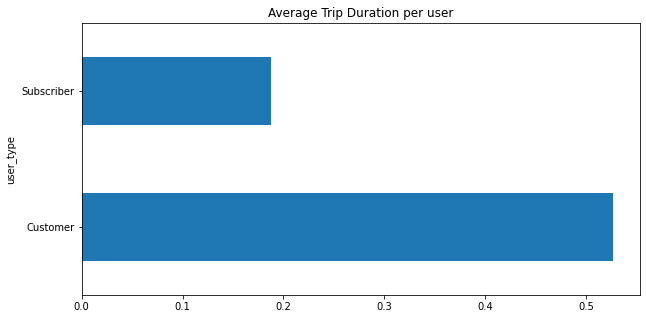

In [ ]:
avg_time_by_utype = df.groupby('user_type')['duration_hour'].mean()
avg_time_by_utype.plot(kind='barh',figsize=(10,5))
plt.title('Average Trip Duration per user')
plt.show()

In [ ]:
fig = px.box(df, y='duration_sec')
fig.show()

Most of the rides are concentrated towards the lower end between 61 and 1685 seconds.
To get a better plot, we can use logarithmic tranformation.

In [ ]:
df['log_dur'] = np.log(df['duration_sec'])
fig = px.box(df, y='log_dur')
fig.show()

In [ ]:
print("Length of duration below 5000 :-  " +
      str(df.query('duration_sec <= 5000').shape[0]))
print("Length of duration above 5000 :-  " +
      str(df.query('duration_sec > 5000').shape[0]))

Length of duration below 5000 :-  190038
Length of duration above 5000 :-  2124


We can ignore the records having duration greater than 5000 since its counts corresponds to only 1.104 % of total number of records.

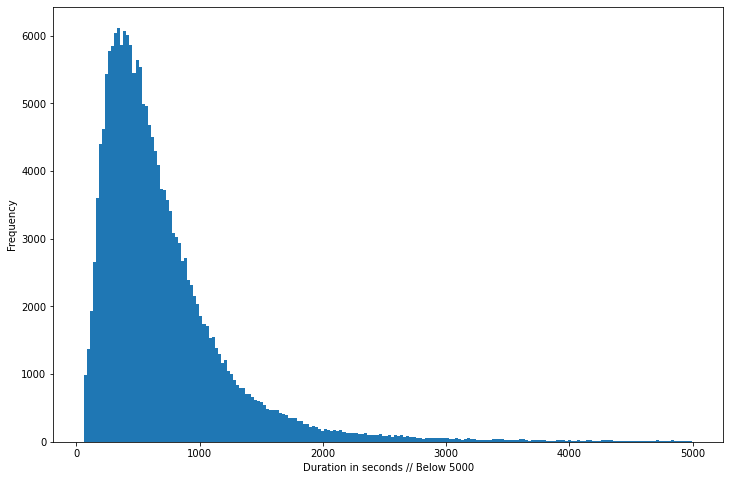

In [ ]:
df.query('duration_sec <= 5000')['duration_sec'].plot.hist(bins = 200 , figsize = (12 , 8)).set(xlabel = 'Duration in seconds // Below 5000')
plt.show()

>This plot has a right skewness.

####Station name
We need to see which are the stations with highest rental.

In [ ]:
len(set(df['end_station_name']))-1

306

There are a total of 306. Top 25 stations with highest number of rentals are,

>Starting station

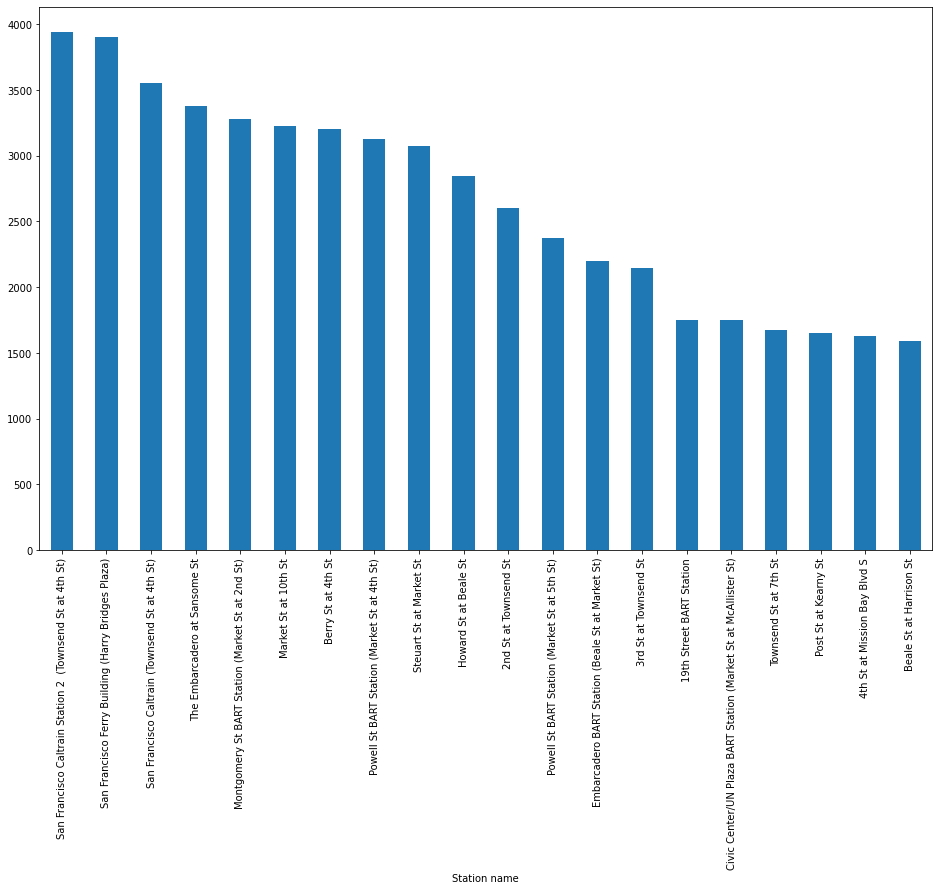

In [ ]:
df['start_station_name'].value_counts().sort_values(ascending = False)[:20].plot(kind = 'bar' , figsize = (16,10)).set(xlabel = 'Station name')
plt.show()

>End Station

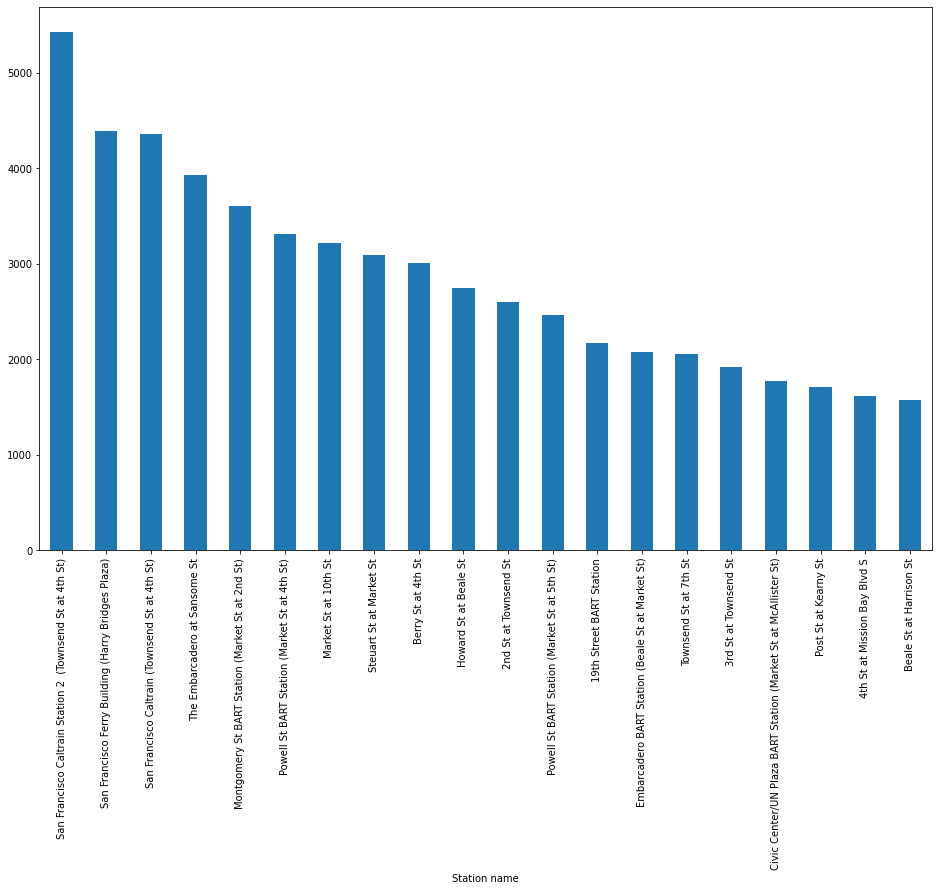

In [ ]:
df['end_station_name'].value_counts().sort_values(ascending = False)[:20].plot(kind = 'bar' , figsize = (16,10)).set(xlabel = 'Station name')
plt.show()

####Analysis of users based on user_type, Gender

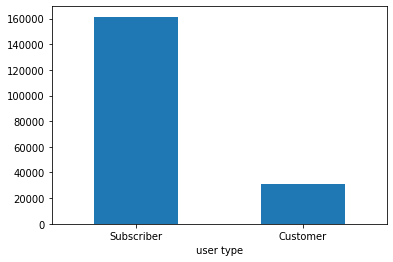

In [ ]:
(df.user_type.value_counts().plot(kind = 'bar' , rot = 0).set(xlabel = 'user type'))
plt.show()


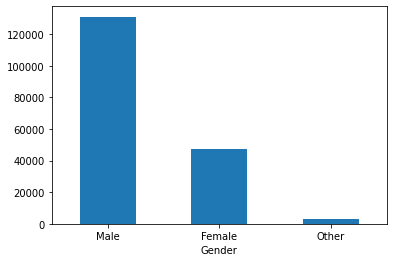

In [ ]:
(df.member_gender.value_counts().plot(kind = 'bar',rot = 0).set(xlabel = 'Gender'))
plt.show()

Majority of users are Male. Also the subscribers are high in number than customers.
The interesting fact is that the average ride duration of customers is higher than that of subscriber even though the number of subscribers are less.

####User age based analysis

In [ ]:
def describe1(x):
  y = x.describe(percentiles = [0.5]).to_frame().T
  y['mode'] = x.mode().values
  y['variance'] = y['std']**2
  y['skewness'] = x.skew()
  return y.T
describe1(df['member_age'])

,member_age
count,181247.000000
mean,34.376999
std,10.313485
min,18.000000
50%,32.000000
max,130.000000
mode,30.000000
variance,106.367973
skewness,1.273050


We can see high variance, it can implies outliers. We can plot histogram to check it.

In [ ]:
fig = px.histogram(df, x="member_age")
fig.show()

>We can see that there are members with age more than 100 which is impossible. We will see the boxplot for analysing this discrepancy.

In [ ]:
fig = px.box(df, y="member_age")
fig.show()

In [ ]:
print("Age below 86 :-  " +
      str(df.query('member_age <= 86').shape[0]))
print("Age above 86 :-  " +
      str(df.query('member_age > 86').shape[0]))

Age below 86 :-  181120
Age above 86 :-  127


The number of members with the age above 86 is less than 0.07%. This we can ignore since its very small and the possibility of people above 86, riding bicycle is very thin.

In [ ]:
df1 = df.query('member_age <= 86')
fig = px.histogram(df1, x="member_age")
fig.show()

Most number of users appear to be having the age between 25 and 40. To analyse it further ww will make age brackets.

In [ ]:
df['age_bracket']=pd.cut(df['member_age'],bins=[0,20,30,40,50,60,70,np.inf],labels=['0-20','20-30','30-40','40-50','50-60','60-70','70+'])
df['age_bracket'].value_counts(dropna=False).to_frame().sort_index()

,age_bracket
0-20,4865
20-30,73058
30-40,61335
40-50,26138
50-60,12432
60-70,2894
70+,525
NaN,10915


Members belong to age group 20-30 is highest in number. Comparing to all the age bracket, we can say that most of the members are of age 20 to 40.


##Bivariate Exploration
We can look into correlation between variables using a heatmap

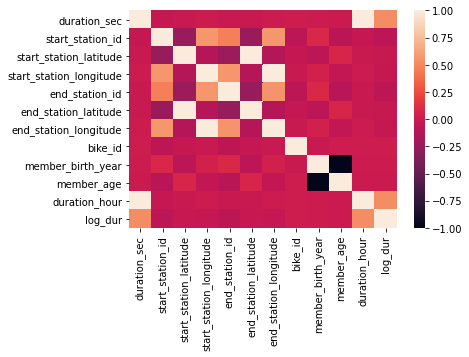

In [ ]:
sns.heatmap(df.corr())
plt.show()

We can see correlation between start station and end station longitude/latitude.

###Analysis of Duration with other columns
> With gender of the members


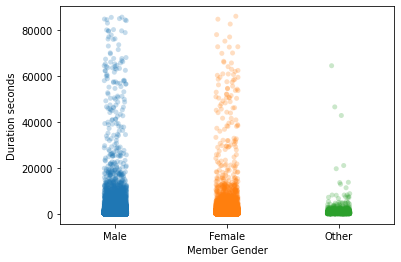

In [ ]:
g = sns.stripplot(x=df["member_gender"] , y=df['duration_sec'] , jitter=True ,alpha = 0.25)
g.set_xlabel('Member Gender')
g.set_ylabel('Duration seconds')
plt.show()

>With user type

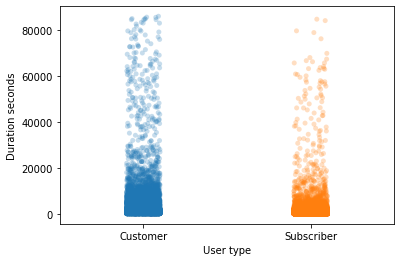

In [ ]:
g = sns.stripplot(x=df["user_type"] , y=df['duration_sec'] , jitter=True , alpha = 0.25)
g.set_xlabel('User type')
g.set_ylabel('Duration seconds')
plt.show()

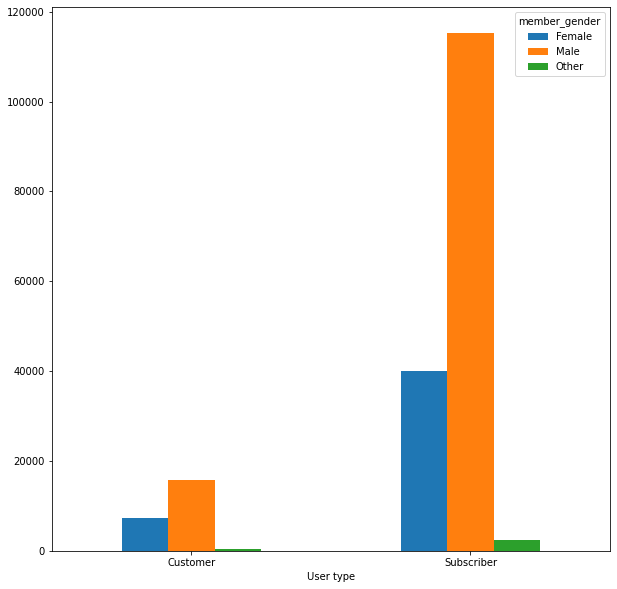

In [ ]:
pd.crosstab(df["user_type"] , df['member_gender']).plot(kind = 'bar' , figsize = (10,10) , rot = 0).set(xlabel = 'User type')
plt.show()

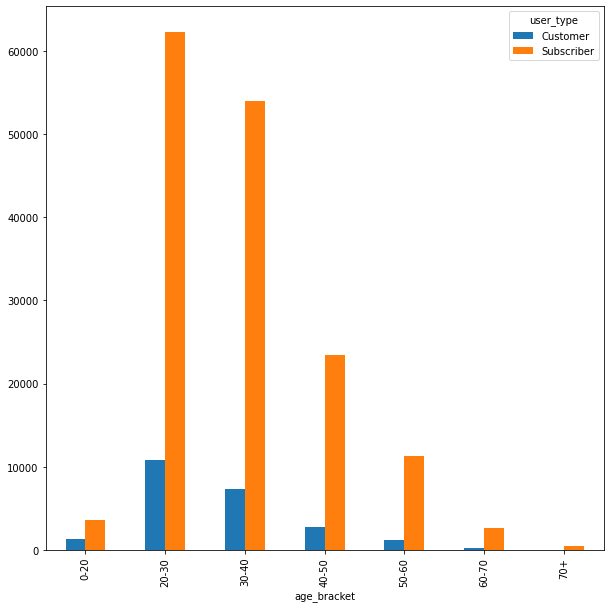

In [ ]:
pd.crosstab(df['age_bracket'] , df['user_type']).plot(kind = 'bar' , figsize = (10,10))


We can see that in all age bracket, Subscribers are high in number.

We can see the number of users sharing the trip.

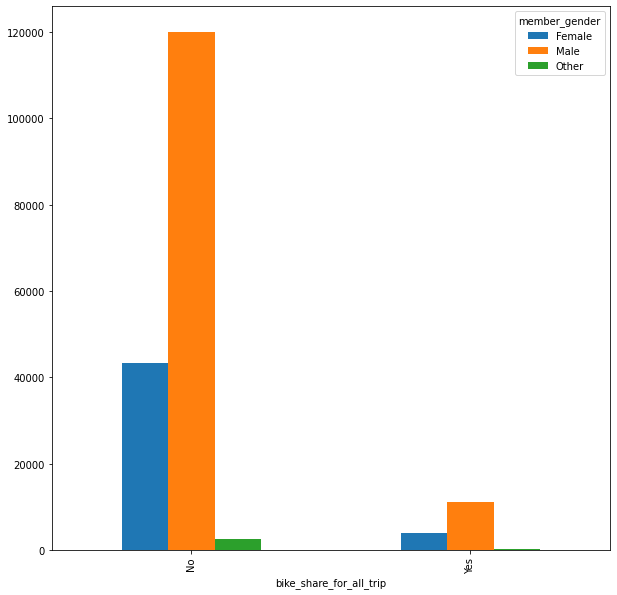

In [ ]:
pd.crosstab(df['bike_share_for_all_trip'] , df['member_gender']).plot(kind = 'bar' , figsize = (10,10))

It is visible that most people don't share the ride. 

We can also analyse the ride sharing with user type.

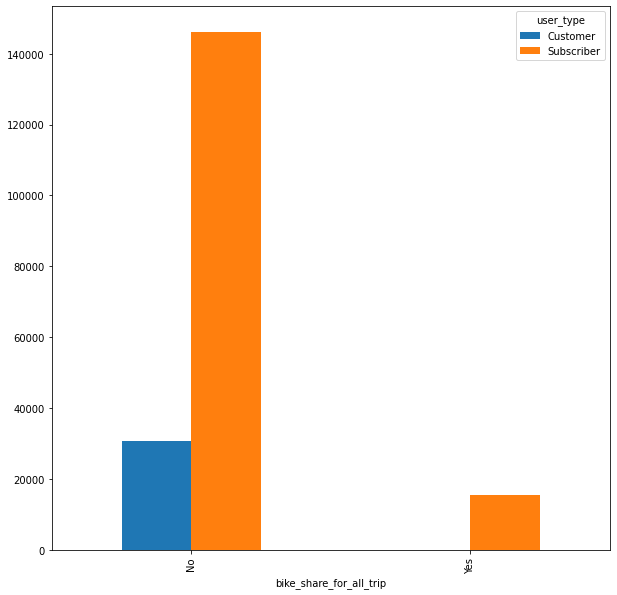

In [ ]:
pd.crosstab(df['bike_share_for_all_trip'] , df['user_type']).plot(kind = 'bar' , figsize = (10,10))

We can see that, No customer share the ride.

##Multivariate Exploration

We can see duration with user type and gender of the user.

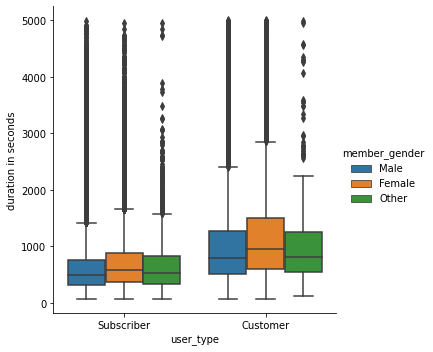

In [ ]:
g = sns.catplot(x="user_type", y="duration_sec", hue="member_gender", kind="box",  data=df.query('duration_sec < 5000'))
g.set_ylabels('duration in seconds')
plt.show()

An interesting fact we can observe is that female users travel more time than male.

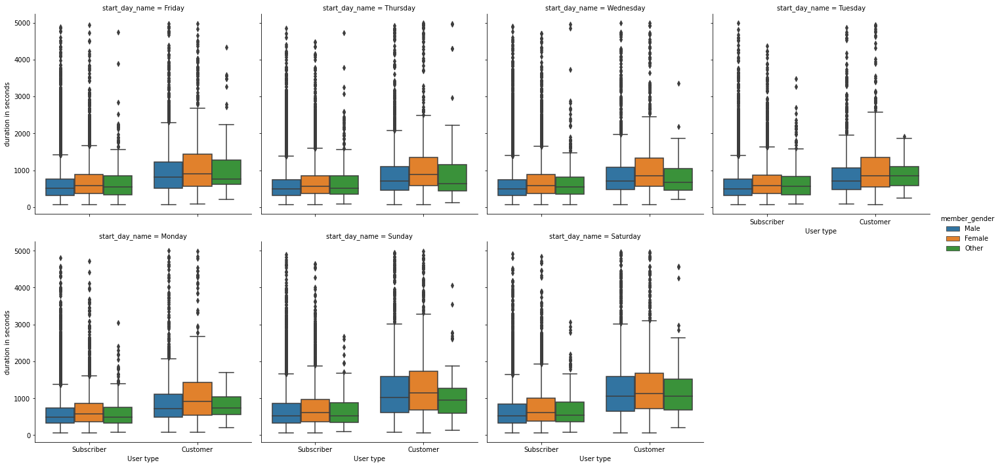

In [ ]:
g = sns.catplot(x="user_type", y="duration_sec",col = 'start_day_name',hue="member_gender",col_wrap=4, kind="box",data=df.query('duration_sec < 5000'))
g.set_xlabels('User type')
g.set_ylabels('duration in seconds')
plt.show()

In all the days of the week, female users are using the bicycle for longer rides. In case of user type also female users rides with longer duration.

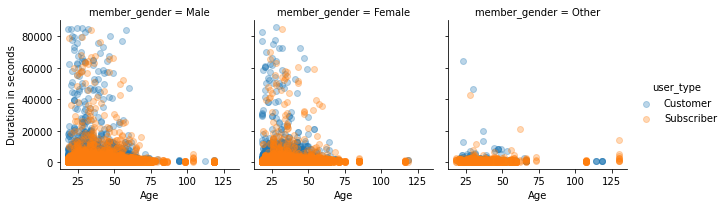

In [ ]:
g = sns.FacetGrid(data=df ,col = 'member_gender' , hue = 'user_type')
g.map(plt.scatter , 'member_age','duration_sec' , alpha = 0.3).add_legend()
g.set_xlabels('Age')
g.set_ylabels('Duration in seconds')
g.set_xticklabels()
plt.show()

##Summary
The usage is high on weekdays, which implies that the members are mostly office workers. The average ride duration of customers is higher than that of subscriber even though the number of subscribers are less. Almost 99 percent of users spend less than 1.38 hr in each trips.
San Francisco Caltrain Station 2  (Townsend St at 4th St), San Francisco Ferry Building (Harry Bridges Plaza) and San Francisco Caltrain (Townsend St at 4th St) stations appears to have more number of counts of rides.